In [1]:
from pathlib import Path
import platform
import sys

import torch

KAGGLE_INPUT = Path("/kaggle/input")

print("Python:", sys.version)
print("İşletim sistemi:", platform.platform())
print("PyTorch:", torch.__version__)
print("CUDA kullanıl:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
else:
    print("GPU aktif değil")

print("\nveri seti:")
for path in sorted(KAGGLE_INPUT.iterdir()):
    print("-", path.name)

jpg_files = list(KAGGLE_INPUT.rglob("*.jpg"))
jpeg_files = list(KAGGLE_INPUT.rglob("*.jpeg"))
png_files = list(KAGGLE_INPUT.rglob("*.png"))
txt_files = list(KAGGLE_INPUT.rglob("*.txt"))

image_files = jpg_files + jpeg_files + png_files

print("\nDosya sayıları:")
print("Görüntü:", len(image_files))
print("TXT:", len(txt_files))

print("\nİlk 5 görüntü:")
for path in image_files[:5]:
    print(path)

print("\nİlk 5 TXT:")
for path in txt_files[:5]:
    print(path)

try:
    import ultralytics
    print("\nUltralytics sürümü:", ultralytics.__version__)
except ImportError:
    print("\nUltralytics kurulu değil.")

Python: 3.12.13 (main, Mar  4 2026, 09:23:07) [GCC 11.4.0]
İşletim sistemi: Linux-6.12.90+-x86_64-with-glibc2.35
PyTorch: 2.10.0+cu128
CUDA kullanıl: True
GPU: Tesla T4

veri seti:
- datasets

Dosya sayıları:
Görüntü: 1448
TXT: 1448

İlk 5 görüntü:
/kaggle/input/datasets/hakantaskiner/personforklift-dataset/hf-dataset/images/val/5TVJ5JGYWGW3_jpg.rf.b5ee516aa2b6252d6e55ba5a63e5685a.jpg
/kaggle/input/datasets/hakantaskiner/personforklift-dataset/hf-dataset/images/val/image_363.jpg
/kaggle/input/datasets/hakantaskiner/personforklift-dataset/hf-dataset/images/val/BJQ8NE68HKOB_jpg.rf.0f7b0a9ccbd9eab34a69be52758a1fd6.jpg
/kaggle/input/datasets/hakantaskiner/personforklift-dataset/hf-dataset/images/val/ARDXMBYY1RSZ_jpg.rf.781a86e1e0dd62dba5fee0f24331b8db.jpg
/kaggle/input/datasets/hakantaskiner/personforklift-dataset/hf-dataset/images/val/image_388.jpg

İlk 5 TXT:
/kaggle/input/datasets/hakantaskiner/personforklift-dataset/hf-dataset/labels/val/32LSCZQDHZO7_jpg.rf.8fddaa4b5ed4db87d19a32d4554b

In [2]:
%pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 17.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.2/66.2 kB 4.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [3]:
import torch
import ultralytics
from ultralytics import YOLO

print("Ultralytics sürümü:", ultralytics.__version__)
print("PyTorch sürümü:", torch.__version__)
print("CUDA kullanılabilir:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

print("Kurulum başarılı.")

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.
Ultralytics sürümü: 8.4.138
PyTorch sürümü: 2.10.0+cu128
CUDA kullanılabilir: True
GPU: Tesla T4
Kurulum başarılı.


In [4]:
from pathlib import Path
from collections import Counter

INPUT_ROOT = Path("/kaggle/input")


candidates = []

for images_dir in INPUT_ROOT.rglob("images"):
    labels_dir = images_dir.parent / "labels"

    if images_dir.is_dir() and labels_dir.is_dir():
        candidates.append(images_dir.parent)

if not candidates:
    raise FileNotFoundError("veri seti bulunamadı.")

print("klasörler:")
for candidate in candidates:
    print("-", candidate)

DATASET_ROOT = candidates[0]
IMAGES_ROOT = DATASET_ROOT / "images"
LABELS_ROOT = DATASET_ROOT / "labels"

print("\nKullanılan veri seti:", DATASET_ROOT)

image_extensions = {".jpg", ".jpeg", ".png"}

total_images = 0
total_labels = 0
class_counts = Counter()
empty_labels = []
invalid_labels = []
missing_images = []
missing_labels = []

for split in ["train", "val", "test"]:
    image_dir = IMAGES_ROOT / split
    label_dir = LABELS_ROOT / split

    images = sorted(
        path for path in image_dir.iterdir()
        if path.suffix.lower() in image_extensions
    )
    labels = sorted(label_dir.glob("*.txt"))

    image_stems = {path.stem for path in images}
    label_stems = {path.stem for path in labels}

    split_missing_labels = sorted(image_stems - label_stems)
    split_missing_images = sorted(label_stems - image_stems)

    missing_labels.extend((split, stem) for stem in split_missing_labels)
    missing_images.extend((split, stem) for stem in split_missing_images)

    print(f"\n{split.upper()}")
    print("Görüntü:", len(images))
    print("Etiket:", len(labels))
    print("Etiketi eksik görüntü:", len(split_missing_labels))
    print("Görüntüsü eksik etiket:", len(split_missing_images))

    total_images += len(images)
    total_labels += len(labels)

    for label_path in labels:
        lines = [
            line.strip()
            for line in label_path.read_text().splitlines()
            if line.strip()
        ]

        if not lines:
            empty_labels.append(label_path)
            continue

        for line_number, line in enumerate(lines, start=1):
            parts = line.split()

            if len(parts) != 5:
                invalid_labels.append(
                    (label_path, line_number, "5 değer bulunmuyor", line)
                )
                continue

            try:
                class_id = int(float(parts[0]))
                x_center, y_center, width, height = map(float, parts[1:])
            except ValueError:
                invalid_labels.append(
                    (label_path, line_number, "Sayısal dönüşüm hatası", line)
                )
                continue

            if not (
                0 <= x_center <= 1
                and 0 <= y_center <= 1
                and 0 < width <= 1
                and 0 < height <= 1
            ):
                invalid_labels.append(
                    (label_path, line_number, "Koordinat aralık hatası", line)
                )
                continue

            class_counts[class_id] += 1

print("\nGENEL SONUÇ")
print("Toplam görüntü:", total_images)
print("Toplam etiket dosyası:", total_labels)
print("Sınıf başına kutu sayısı:", dict(sorted(class_counts.items())))
print("Boş etiket dosyası:", len(empty_labels))
print("Geçersiz etiket satırı:", len(invalid_labels))
print("Etiketi eksik görüntü:", len(missing_labels))
print("Görüntüsü eksik etiket:", len(missing_images))

if invalid_labels:
    print("\nİlk geçersiz etiketler:")
    for error in invalid_labels[:5]:
        print(error)

klasörler:
- /kaggle/input/datasets/hakantaskiner/personforklift-dataset/hf-dataset

Kullanılan veri seti: /kaggle/input/datasets/hakantaskiner/personforklift-dataset/hf-dataset

TRAIN
Görüntü: 1249
Etiket: 1249
Etiketi eksik görüntü: 0
Görüntüsü eksik etiket: 0

VAL
Görüntü: 119
Etiket: 119
Etiketi eksik görüntü: 0
Görüntüsü eksik etiket: 0

TEST
Görüntü: 80
Etiket: 80
Etiketi eksik görüntü: 0
Görüntüsü eksik etiket: 0

GENEL SONUÇ
Toplam görüntü: 1448
Toplam etiket dosyası: 1448
Sınıf başına kutu sayısı: {0: 1411, 1: 1729}
Boş etiket dosyası: 1
Geçersiz etiket satırı: 0
Etiketi eksik görüntü: 0
Görüntüsü eksik etiket: 0


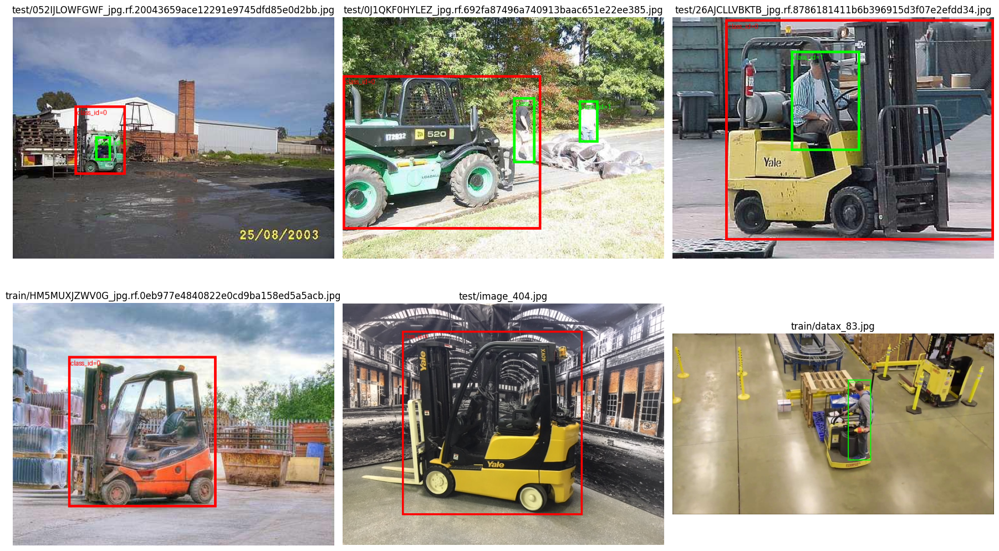

In [5]:
import random
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

random.seed(42)

COLORS = {
    0: "red",
    1: "lime",
}

def corresponding_image(label_path):
    split = label_path.parent.name
    stem = label_path.stem

    for extension in [".jpg", ".jpeg", ".png"]:
        candidate = IMAGES_ROOT / split / f"{stem}{extension}"

        if candidate.exists():
            return candidate

    return None

def read_class_ids(label_path):
    class_ids = set()

    for line in label_path.read_text().splitlines():
        parts = line.split()
        if len(parts) == 5:
            class_ids.add(int(float(parts[0])))

    return class_ids

all_label_files = sorted(LABELS_ROOT.rglob("*.txt"))

# İki sınıfı da içeren görüntülere öncelik ver.
both_classes = [
    path
    for path in all_label_files
    if read_class_ids(path) == {0, 1}
]

other_labels = [
    path
    for path in all_label_files
    if path not in both_classes
]

selected_labels = both_classes[:3]

remaining_count = 6 - len(selected_labels)
if remaining_count > 0:
    selected_labels.extend(
        random.sample(other_labels, min(remaining_count, len(other_labels)))
    )

fig, axes = plt.subplots(2, 3, figsize=(18, 11))
axes = axes.flatten()

for axis, label_path in zip(axes, selected_labels):
    image_path = corresponding_image(label_path)

    if image_path is None:
        axis.set_title(f"Görüntü bulunamadı: {label_path.name}")
        axis.axis("off")
        continue

    image = Image.open(image_path).convert("RGB")
    draw = ImageDraw.Draw(image)

    image_width, image_height = image.size

    for line in label_path.read_text().splitlines():
        parts = line.split()

        if len(parts) != 5:
            continue

        class_id = int(float(parts[0]))
        x_center, y_center, box_width, box_height = map(float, parts[1:])

        x1 = (x_center - box_width / 2) * image_width
        y1 = (y_center - box_height / 2) * image_height
        x2 = (x_center + box_width / 2) * image_width
        y2 = (y_center + box_height / 2) * image_height

        color = COLORS.get(class_id, "yellow")

        draw.rectangle(
            [(x1, y1), (x2, y2)],
            outline=color,
            width=4,
        )

        draw.text(
            (x1 + 4, y1 + 4),
            f"class_id={class_id}",
            fill=color,
        )

    axis.imshow(image)
    axis.set_title(f"{label_path.parent.name}/{image_path.name}")
    axis.axis("off")

for axis in axes[len(selected_labels):]:
    axis.axis("off")

plt.tight_layout()
plt.show()

In [6]:
from pathlib import Path
import yaml

INPUT_ROOT = Path("/kaggle/input")


dataset_candidates = [
    images_dir.parent
    for images_dir in INPUT_ROOT.rglob("images")
    if (images_dir.parent / "labels").is_dir()
]

if not dataset_candidates:
    raise FileNotFoundError("YOLO veri seti klasörü bulunamadı.")

DATASET_ROOT = dataset_candidates[0]
DATA_YAML = Path("/kaggle/working/person_forklift.yaml")

dataset_config = {
    "path": str(DATASET_ROOT),
    "train": "images/train",
    "val": "images/val",
    "test": "images/test",
    "names": {
        0: "forklift",
        1: "person",
    },
}

with DATA_YAML.open("w", encoding="utf-8") as yaml_file:
    yaml.safe_dump(
        dataset_config,
        yaml_file,
        sort_keys=False,
        allow_unicode=True,
    )

print("Oluşturulan dosya:", DATA_YAML)
print("\nDosya içeriği:")
print(DATA_YAML.read_text(encoding="utf-8"))


for split in ["train", "val", "test"]:
    split_path = DATASET_ROOT / "images" / split
    assert split_path.is_dir(), f"Eksik klasör: {split_path}"
    print(f"{split}: {split_path} ✓")

assert dataset_config["names"][0] == "forklift"
assert dataset_config["names"][1] == "person"

print("\ndata.yaml kontrolü başarılı")

Oluşturulan dosya: /kaggle/working/person_forklift.yaml

Dosya içeriği:
path: /kaggle/input/datasets/hakantaskiner/personforklift-dataset/hf-dataset
train: images/train
val: images/val
test: images/test
names:
  0: forklift
  1: person

train: /kaggle/input/datasets/hakantaskiner/personforklift-dataset/hf-dataset/images/train ✓
val: /kaggle/input/datasets/hakantaskiner/personforklift-dataset/hf-dataset/images/val ✓
test: /kaggle/input/datasets/hakantaskiner/personforklift-dataset/hf-dataset/images/test ✓

data.yaml kontrolü başarılı


In [7]:
from pathlib import Path

import torch
import ultralytics
from ultralytics import YOLO

assert torch.cuda.is_available(), "CUDA aktif değil."
assert DATA_YAML.exists(), f"data.yaml bulunamadı: {DATA_YAML}"

print("Ultralytics:", ultralytics.__version__)
print("GPU:", torch.cuda.get_device_name(0))
print("Yapılandırma:", DATA_YAML)

BASE_MODEL = "yolo11n.pt"

model = YOLO(BASE_MODEL)

smoke_results = model.train(
    data=str(DATA_YAML),
    epochs=1,
    imgsz=640,
    batch=16,
    device=0,
    workers=2,
    project="/kaggle/working/runs",
    name="smoke_test",
    exist_ok=True,
    pretrained=True,
    seed=42,
    deterministic=True,
    cache=False,
    plots=True,
    verbose=True,
)

RUN_DIR = Path(model.trainer.save_dir)
BEST_MODEL = RUN_DIR / "weights" / "best.pt"
LAST_MODEL = RUN_DIR / "weights" / "last.pt"

print("\nDeneme klasörü:", RUN_DIR)
print("best.pt mevcut:", BEST_MODEL.exists())
print("last.pt mevcut:", LAST_MODEL.exists())

if BEST_MODEL.exists():
    print("best.pt boyutu:", round(BEST_MODEL.stat().st_size / 1024**2, 2), "MB")

print("\nepoch deneme eğitimi tamamlandı ")

Ultralytics: 8.4.138
GPU: Tesla T4
Yapılandırma: /kaggle/working/person_forklift.yaml
Ultralytics 8.4.138 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/person_forklift.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=1, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yol

/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(


Optimizer stripped from /kaggle/working/runs/smoke_test/weights/best.pt, 5.5MB

Validating /kaggle/working/runs/smoke_test/weights/best.pt...
Ultralytics 8.4.138 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLO11n summary (fused): 101 layers, 2,582,542 parameters, 0 gradients, 6.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 2.5s/it 9.8s0.9ss
                   all        119        206      0.558      0.137     0.0482      0.012
              forklift        118        131      0.117      0.275      0.079     0.0187
                person         40         75          1          0     0.0173    0.00532
Speed: 0.2ms preprocess, 76.9ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to /kaggle/working/runs/smoke_test

Deneme klasörü: /kaggle/working/runs/smoke_test
best.pt mevcut: True
last.pt mevcut: True
best.pt boyutu: 5.21 MB

epoch deneme eğitimi tamamlandı 


In [8]:
from pathlib import Path
from ultralytics import YOLO

BASE_MODEL = "yolo11n.pt"
RUN_NAME = "person_forklift_yolo11n_baseline"

model = YOLO(BASE_MODEL)

train_results = model.train(
    data=str(DATA_YAML),

    # Eğitim
    epochs=50,
    patience=15,
    batch=16,
    imgsz=640,

    # Donanım
    device=0,
    workers=2,
    amp=True,
    cache=False,

    # Tekrarlanabilirlik
    seed=42,
    deterministic=True,

    # Çıktılar
    project="/kaggle/working/runs",
    name=RUN_NAME,
    exist_ok=False,
    save=True,
    save_period=10,
    plots=True,
    verbose=True,
)

RUN_DIR = Path(model.trainer.save_dir)
BEST_MODEL = RUN_DIR / "weights" / "best.pt"
LAST_MODEL = RUN_DIR / "weights" / "last.pt"

print("\nEğitim klasörü:", RUN_DIR)
print("En iyi model:", BEST_MODEL)
print("best.pt mevcut:", BEST_MODEL.exists())
print("last.pt mevcut:", LAST_MODEL.exists())

if BEST_MODEL.exists():
    print(
        "best.pt boyutu:",
        round(BEST_MODEL.stat().st_size / 1024**2, 2),
        "MB",
    )

print("\nTemel model eğitimi tamamlandı ")

Ultralytics 8.4.138 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/person_forklift.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=person_forklift_yolo11n_b

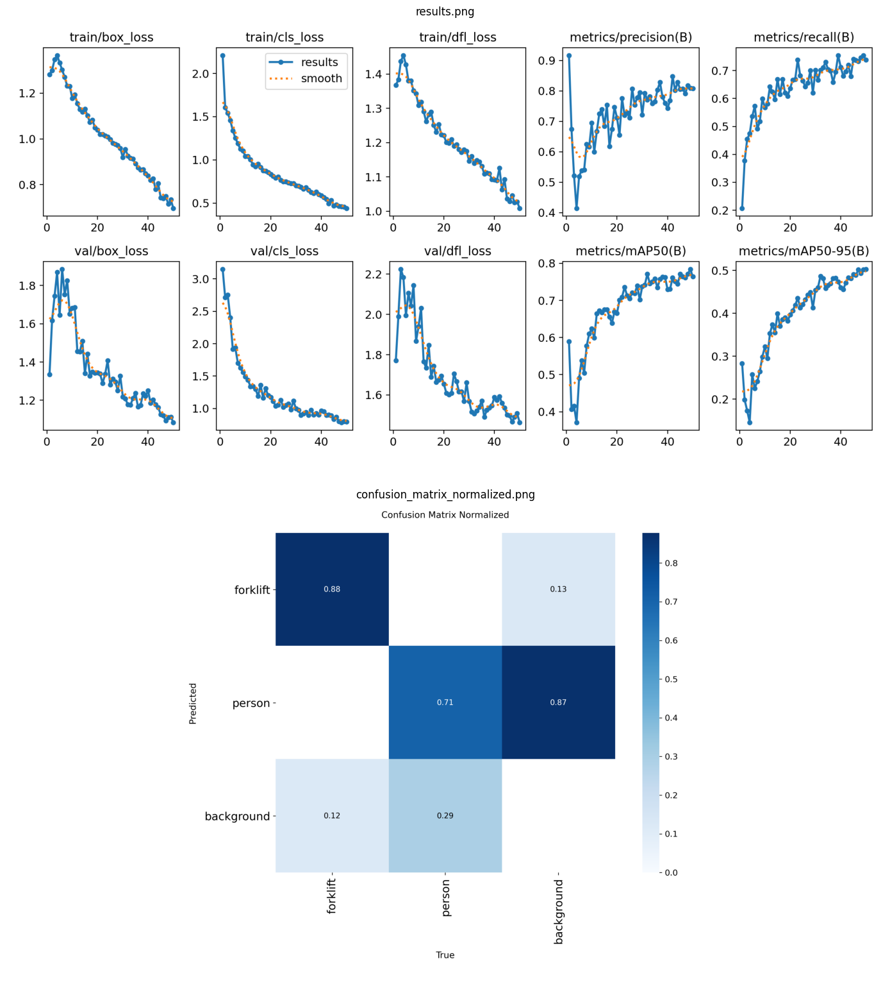

In [9]:
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

RUN_DIR = Path(
    "/kaggle/working/runs/person_forklift_yolo11n_baseline"
)

plot_names = [
    "results.png",
    "confusion_matrix_normalized.png",
    "PR_curve.png",
    "F1_curve.png",
]

available_plots = [
    RUN_DIR / name
    for name in plot_names
    if (RUN_DIR / name).exists()
]

fig, axes = plt.subplots(
    len(available_plots),
    1,
    figsize=(14, 8 * len(available_plots)),
)

if len(available_plots) == 1:
    axes = [axes]

for axis, plot_path in zip(axes, available_plots):
    axis.imshow(Image.open(plot_path))
    axis.set_title(plot_path.name)
    axis.axis("off")

plt.tight_layout()
plt.show()

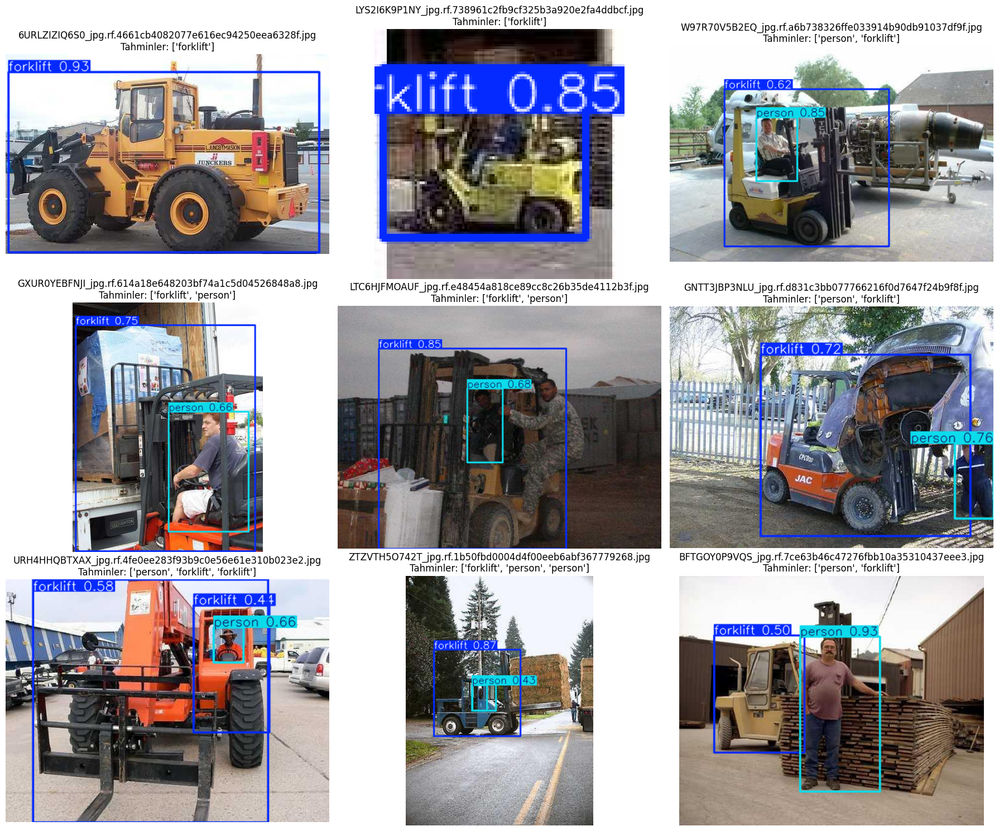

In [11]:
import random
import matplotlib.pyplot as plt
from ultralytics import YOLO

BEST_MODEL = RUN_DIR / "weights" / "best.pt"

model = YOLO(str(BEST_MODEL))

val_labels_dir = DATASET_ROOT / "labels" / "val"
val_images_dir = DATASET_ROOT / "images" / "val"

def contains_class(label_path, target_class):
    for line in label_path.read_text().splitlines():
        parts = line.split()

        if len(parts) == 5 and int(float(parts[0])) == target_class:
            return True

    return False

def find_matching_image(label_path):
    for extension in [".jpg", ".jpeg", ".png"]:
        image_path = val_images_dir / f"{label_path.stem}{extension}"

        if image_path.exists():
            return image_path

    return None

person_labels = [
    path
    for path in val_labels_dir.glob("*.txt")
    if contains_class(path, target_class=1)
]

random.seed(42)
selected_labels = random.sample(
    person_labels,
    min(9, len(person_labels)),
)

selected_images = [
    find_matching_image(path)
    for path in selected_labels
]

selected_images = [
    path for path in selected_images
    if path is not None
]

predictions = model.predict(
    source=[str(path) for path in selected_images],
    imgsz=640,
    conf=0.25,
    iou=0.70,
    device=0,
    verbose=False,
)

fig, axes = plt.subplots(3, 3, figsize=(18, 15))
axes = axes.flatten()

for axis, result in zip(axes, predictions):
    plotted_image = result.plot()

    # result.plot() BGR döndürür; matplotlib RGB bekler.
    plotted_image = plotted_image[:, :, ::-1]

    detected_classes = []

    if result.boxes is not None:
        for class_id in result.boxes.cls.tolist():
            detected_classes.append(result.names[int(class_id)])

    axis.imshow(plotted_image)
    axis.set_title(
        f"{Path(result.path).name}\n"
        f"Tahminler: {detected_classes}"
    )
    axis.axis("off")

for axis in axes[len(predictions):]:
    axis.axis("off")

plt.tight_layout()
plt.show()

In [12]:
from pathlib import Path
from ultralytics import YOLO

RUN_NAME_100 = "person_forklift_yolo11n_100e"

model_100 = YOLO("yolo11n.pt")

train_results_100 = model_100.train(
    data=str(DATA_YAML),

    epochs=100,
    patience=20,
    batch=16,
    imgsz=640,

    device=0,
    workers=2,
    amp=True,
    cache=False,

    seed=42,
    deterministic=True,

    project="/kaggle/working/runs",
    name=RUN_NAME_100,
    exist_ok=False,
    save=True,
    save_period=10,
    plots=True,
    verbose=True,
)

RUN_DIR_100 = Path(model_100.trainer.save_dir)
BEST_MODEL_100 = RUN_DIR_100 / "weights" / "best.pt"

print("\n100 epoch deney klasörü:", RUN_DIR_100)
print("En iyi model:", BEST_MODEL_100)
print("best.pt mevcut:", BEST_MODEL_100.exists())

if BEST_MODEL_100.exists():
    print(
        "best.pt boyutu:",
        round(BEST_MODEL_100.stat().st_size / 1024**2, 2),
        "MB",
    )

Ultralytics 8.4.138 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/person_forklift.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=person_forklift_yolo11n_

In [13]:
from pathlib import Path
import json

from ultralytics import YOLO

SELECTED_MODEL = Path(
    "/kaggle/working/runs/"
    "person_forklift_yolo11n_baseline/weights/best.pt"
)

assert SELECTED_MODEL.exists(), f"Model bulunamadı: {SELECTED_MODEL}"
assert DATA_YAML.exists(), f"YAML bulunamadı: {DATA_YAML}"

test_model = YOLO(str(SELECTED_MODEL))

test_metrics = test_model.val(
    data=str(DATA_YAML),
    split="test",
    imgsz=640,
    batch=16,
    device=0,
    workers=2,
    plots=True,
    project="/kaggle/working/runs",
    name="person_forklift_yolo11n_test",
    exist_ok=False,
)

summary = {
    "selected_model": str(SELECTED_MODEL),
    "precision": float(test_metrics.box.mp),
    "recall": float(test_metrics.box.mr),
    "mAP50": float(test_metrics.box.map50),
    "mAP50_95": float(test_metrics.box.map),
    "classes": {},
}

print("\nTEST SONUÇLARI")
print("Genel precision:", round(test_metrics.box.mp, 4))
print("Genel recall:", round(test_metrics.box.mr, 4))
print("Genel mAP50:", round(test_metrics.box.map50, 4))
print("Genel mAP50-95:", round(test_metrics.box.map, 4))

for class_id, class_name in test_model.names.items():
    precision, recall, map50, map50_95 = (
        test_metrics.box.class_result(class_id)
    )

    summary["classes"][class_name] = {
        "precision": float(precision),
        "recall": float(recall),
        "mAP50": float(map50),
        "mAP50_95": float(map50_95),
    }

    print(f"\nSınıf: {class_name}")
    print("Precision:", round(float(precision), 4))
    print("Recall:", round(float(recall), 4))
    print("mAP50:", round(float(map50), 4))
    print("mAP50-95:", round(float(map50_95), 4))

METRICS_PATH = Path("/kaggle/working/test_metrics.json")
METRICS_PATH.write_text(
    json.dumps(summary, indent=2),
    encoding="utf-8",
)

print("\nMetrikler kaydedildi:", METRICS_PATH)

Ultralytics 8.4.138 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLO11n summary (fused): 101 layers, 2,582,542 parameters, 0 gradients, 6.4 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 1.1±1.0 ms, read: 13.0±9.9 MB/s, size: 75.7 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips
val: Scanning /kaggle/input/datasets/hakantaskiner/personforklift-dataset/hf-dataset/labels/test... 80 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 80/80 367.8it/s 0.2s0.0s
WARNING ⚠️ val: Cache directory /kaggle/input/datasets/hakantaskiner/personforklift-dataset/hf-dataset/labels is not writable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 5/5 2.8it/s 1.8s0.5s
                   all         80        125      0.603      0.691      0.591      0.374
              forklift         79         81      0.865 

In [14]:
from pathlib import Path
import hashlib
import shutil

SELECTED_MODEL = Path(
    "/kaggle/working/runs/"
    "person_forklift_yolo11n_baseline/weights/best.pt"
)

EXPORT_MODEL = Path(
    "/kaggle/working/person_forklift_yolo11n_best.pt"
)

shutil.copy2(SELECTED_MODEL, EXPORT_MODEL)

sha256 = hashlib.sha256(EXPORT_MODEL.read_bytes()).hexdigest()

print("Model kopyalandı:", EXPORT_MODEL)
print("Boyut:", round(EXPORT_MODEL.stat().st_size / 1024**2, 2), "MB")
print("SHA-256:", sha256)

Model kopyalandı: /kaggle/working/person_forklift_yolo11n_best.pt
Boyut: 5.22 MB
SHA-256: 46bfce33c717a8a765ed3c34225c625fb9d91a226fb6d407b7735cc23097725f


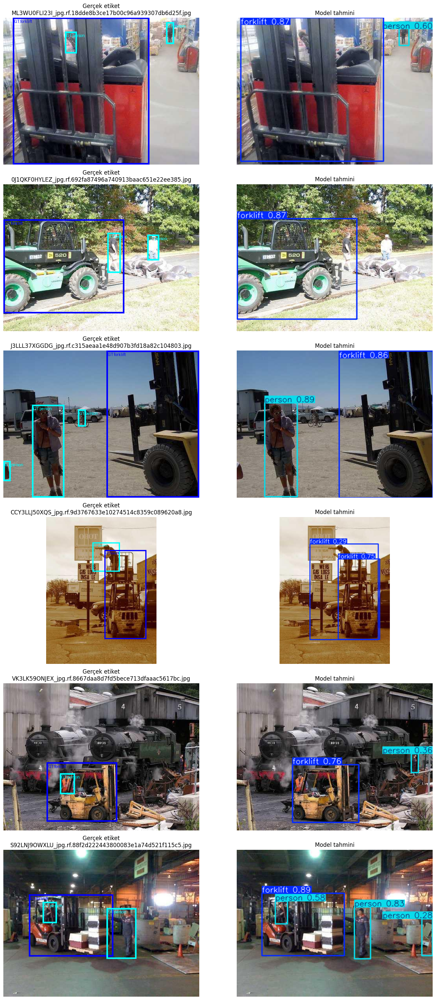

In [15]:
import random
from pathlib import Path

import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from ultralytics import YOLO

test_images_dir = DATASET_ROOT / "images" / "test"
test_labels_dir = DATASET_ROOT / "labels" / "test"

COLORS = {
    0: "blue",
    1: "cyan",
}

CLASS_NAMES = {
    0: "forklift",
    1: "person",
}

def contains_person(label_path):
    for line in label_path.read_text().splitlines():
        parts = line.split()

        if len(parts) == 5 and int(float(parts[0])) == 1:
            return True

    return False

def matching_image(label_path):
    for extension in [".jpg", ".jpeg", ".png"]:
        candidate = test_images_dir / f"{label_path.stem}{extension}"

        if candidate.exists():
            return candidate

    return None

def draw_ground_truth(image_path, label_path):
    image = Image.open(image_path).convert("RGB")
    draw = ImageDraw.Draw(image)

    image_width, image_height = image.size

    for line in label_path.read_text().splitlines():
        parts = line.split()

        if len(parts) != 5:
            continue

        class_id = int(float(parts[0]))
        x_center, y_center, box_width, box_height = map(float, parts[1:])

        x1 = (x_center - box_width / 2) * image_width
        y1 = (y_center - box_height / 2) * image_height
        x2 = (x_center + box_width / 2) * image_width
        y2 = (y_center + box_height / 2) * image_height

        color = COLORS[class_id]

        draw.rectangle(
            [(x1, y1), (x2, y2)],
            outline=color,
            width=4,
        )

        draw.text(
            (x1 + 4, y1 + 4),
            f"GT {CLASS_NAMES[class_id]}",
            fill=color,
        )

    return image

person_test_labels = [
    path
    for path in test_labels_dir.glob("*.txt")
    if contains_person(path)
]

random.seed(7)

selected_labels = random.sample(
    person_test_labels,
    min(6, len(person_test_labels)),
)

selected_images = [
    matching_image(label_path)
    for label_path in selected_labels
]

inspection_model = YOLO(str(SELECTED_MODEL))

test_predictions = inspection_model.predict(
    source=[str(path) for path in selected_images],
    imgsz=640,
    conf=0.25,
    iou=0.70,
    device=0,
    verbose=False,
)

fig, axes = plt.subplots(
    len(selected_images),
    2,
    figsize=(15, 5 * len(selected_images)),
)

for row, (image_path, label_path, prediction) in enumerate(
    zip(selected_images, selected_labels, test_predictions)
):
    ground_truth_image = draw_ground_truth(image_path, label_path)
    prediction_image = prediction.plot()[:, :, ::-1]

    axes[row, 0].imshow(ground_truth_image)
    axes[row, 0].set_title(f"Gerçek etiket\n{image_path.name}")
    axes[row, 0].axis("off")

    axes[row, 1].imshow(prediction_image)
    axes[row, 1].set_title("Model tahmini")
    axes[row, 1].axis("off")

plt.tight_layout()
plt.show()

In [16]:
from pathlib import Path
from zipfile import ZipFile, ZIP_DEFLATED

TRAIN_RUN = Path(
    "/kaggle/working/runs/person_forklift_yolo11n_baseline"
)

TEST_RUN = Path(
    "/kaggle/working/runs/person_forklift_yolo11n_test"
)

SELECTED_MODEL = TRAIN_RUN / "weights" / "best.pt"
ARTIFACT_ZIP = Path(
    "/kaggle/working/person_forklift_yolo11n_artifacts.zip"
)

artifact_files = {
    SELECTED_MODEL: "model/person_forklift_yolo11n_best.pt",
    TRAIN_RUN / "args.yaml": "training/args.yaml",
    TRAIN_RUN / "results.csv": "training/results.csv",
    TRAIN_RUN / "results.png": "training/results.png",
    TRAIN_RUN / "confusion_matrix.png": "training/confusion_matrix.png",
    TRAIN_RUN / "confusion_matrix_normalized.png":
        "training/confusion_matrix_normalized.png",
    Path("/kaggle/working/person_forklift.yaml"):
        "training/person_forklift.yaml",
    Path("/kaggle/working/test_metrics.json"):
        "test/test_metrics.json",
    TEST_RUN / "confusion_matrix.png":
        "test/confusion_matrix.png",
    TEST_RUN / "confusion_matrix_normalized.png":
        "test/confusion_matrix_normalized.png",
}

with ZipFile(ARTIFACT_ZIP, "w", ZIP_DEFLATED) as zip_file:
    for source_path, archive_path in artifact_files.items():
        if source_path.exists():
            zip_file.write(source_path, archive_path)
            print("Eklendi:", archive_path)
        else:
            print("Bulunamadı, atlandı:", source_path)

print(
    "\nZIP hazır:",
    ARTIFACT_ZIP,
    f"({ARTIFACT_ZIP.stat().st_size / 1024**2:.2f} MB)",
)

Eklendi: model/person_forklift_yolo11n_best.pt
Eklendi: training/args.yaml
Eklendi: training/results.csv
Eklendi: training/results.png
Eklendi: training/confusion_matrix.png
Eklendi: training/confusion_matrix_normalized.png
Eklendi: training/person_forklift.yaml
Eklendi: test/test_metrics.json
Eklendi: test/confusion_matrix.png
Eklendi: test/confusion_matrix_normalized.png

ZIP hazır: /kaggle/working/person_forklift_yolo11n_artifacts.zip (5.24 MB)
